# Predict House Prices in King County, Washington  

King County, Washington is the most populous county in Washington. It is also the 12th most populous in the United States. Washington's most populous city is Seattle.My goal is to predict the price of a house based on houses sold between May 2014 to May 2015 in King County, Washington State, USA for and create a model that home buyers, home sellers, and online property listings can use to determine the price of a home.  

## Table of Contents:
* [Data Wrangling](#DataWrangling)
* [Data Profile](#DataProfile)
* [Data Relationships](#DataRelationships)
* [Data Distribution](#DataDistribution)
* [Price vs Features](#PriceVSFeatures)

In [1]:
#imports
import pandas as pd
#import opendatasets as od
#import os
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
#from sklearn.decomposition import PCA
#from sklearn.preprocessing import scale
#from sklearn import linear_model
#from sklearn.preprocessing import StandardScaler

# 1. Data Wrangling <a class="anchor" id="DataWrangling"></a>

## 1.1 Collect

The dataset I am using is <a href="https://www.kaggle.com/shivachandel/kc-house-data">here</a>. 

In [2]:
#get the data from API
#housingAPI = od.download("https://www.kaggle.com/shivachandel/kc-house-data")

In [3]:
#get the data and read it 
housingData = pd.read_csv('../Data/kc_house_data.csv')

## 1.2 Clean and Organize Data

This section is cleaning and organizing the data.

In [4]:
#Check for duplicates
housingData.duplicated()

duplicate = housingData[housingData.duplicated()]
print(duplicate)

Empty DataFrame
Columns: [id, date, price, bedrooms, bathrooms, sqft_living, sqft_lot, floors, waterfront, view, condition, grade, sqft_above, sqft_basement, yr_built, yr_renovated, zipcode, lat, long, sqft_living15, sqft_lot15]
Index: []

[0 rows x 21 columns]


In [5]:
#Check for any null values
print(housingData.isnull().values.any())

True


In [6]:
#Check how many null values
print(housingData.isnull().sum())

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       2
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64


In [7]:
# 2 null values are in the sqft_above column > index 10 & 17
housingData[housingData['sqft_above'].isna()]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
10,1736800520,20150403T000000,662500.0,3,2.5,3560,9796,1.0,0,0,...,8,NaN,1700,1965,0,98007,47.6007,-122.145,2210,8925
17,6865200140,20140529T000000,485000.0,4,1.0,1600,4300,1.5,0,0,...,7,NaN,0,1916,0,98103,47.6648,-122.343,1610,4300


In [8]:
#Remove the rows where sqft_above is not NA
newHousingDF = housingData[housingData['sqft_above'].notna()]

newHousingDF.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [9]:
#drop the outliers row
newHousingDF = newHousingDF[newHousingDF["bedrooms"] < 12]
newHousingDF[newHousingDF["bedrooms"] > 10]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8757,1773100755,20140821T000000,520000.0,11,3.0,3000,4960,2.0,0,0,...,7,2400.0,600,1918,1999,98106,47.556,-122.363,1420,4960


In [10]:
#Check if bedrooms are more than 0
newHousingDF[newHousingDF["bedrooms"] == 0]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
875,6306400140,20140612T000000,1095000.0,0,0.00,3064,4764,3.5,0,2,...,7,3064.0,0,1990,0,98102,47.6362,-122.322,2360,4000
3119,3918400017,20150205T000000,380000.0,0,0.00,1470,979,3.0,0,2,...,8,1470.0,0,2006,0,98133,47.7145,-122.356,1470,1399
3467,1453602309,20140805T000000,288000.0,0,1.50,1430,1650,3.0,0,0,...,7,1430.0,0,1999,0,98125,47.7222,-122.290,1430,1650
4868,6896300380,20141002T000000,228000.0,0,1.00,390,5900,1.0,0,0,...,4,390.0,0,1953,0,98118,47.5260,-122.261,2170,6000
6994,2954400190,20140624T000000,1295650.0,0,0.00,4810,28008,2.0,0,0,...,12,4810.0,0,1990,0,98053,47.6642,-122.069,4740,35061
8477,2569500210,20141117T000000,339950.0,0,2.50,2290,8319,2.0,0,0,...,8,2290.0,0,1985,0,98042,47.3473,-122.151,2500,8751
8484,2310060040,20140925T000000,240000.0,0,2.50,1810,5669,2.0,0,0,...,7,1810.0,0,2003,0,98038,47.3493,-122.053,1810,5685
9773,3374500520,20150429T000000,355000.0,0,0.00,2460,8049,2.0,0,0,...,8,2460.0,0,1990,0,98031,47.4095,-122.168,2520,8050
9854,7849202190,20141223T000000,235000.0,0,0.00,1470,4800,2.0,0,0,...,7,1470.0,0,1996,0,98065,47.5265,-121.828,1060,7200
12653,7849202299,20150218T000000,320000.0,0,2.50,1490,7111,2.0,0,0,...,7,1490.0,0,1999,0,98065,47.5261,-121.826,1500,4675


In [11]:
#remove the houses with 0 bedrooms
newHousingDF = newHousingDF[newHousingDF["bedrooms"] > 0]
newHousingDF[newHousingDF["bedrooms"] == 0]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15


In [12]:
#remove houses over 75k square footage 
newHousingDF = newHousingDF[newHousingDF["sqft_lot"] < 75000]
newHousingDF[newHousingDF["sqft_lot"] > 75000]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15


# 2. Data Profile  <a class="anchor" id="DataProfile"></a>

In this section, I am reviewing the data to get a better understanding of it.

## 2.1

In [13]:
#Show summary of stats with transpose 
newHousingDF.describe().T

,count,mean,std,min,25%,50%,75%,max
id,20996.0,4.646328e+09,2.874543e+09,1.000102e+06,2.193340e+09,4.022900e+09,7.385858e+09,9.900000e+09
price,20996.0,5.366528e+05,3.666766e+05,7.500000e+04,3.200000e+05,4.499500e+05,6.399125e+05,7.700000e+06
bedrooms,20996.0,3.370594e+00,9.047362e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,1.100000e+01
bathrooms,20996.0,2.106532e+00,7.629692e-01,0.000000e+00,1.500000e+00,2.250000e+00,2.500000e+00,8.000000e+00
sqft_living,20996.0,2.058822e+03,8.949179e+02,3.700000e+02,1.420000e+03,1.900000e+03,2.520000e+03,1.205000e+04
sqft_lot,20996.0,9.844076e+03,9.537054e+03,5.200000e+02,5.000000e+03,7.500000e+03,1.023000e+04,7.449500e+04
floors,20996.0,1.493189e+00,5.410083e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
waterfront,20996.0,7.525243e-03,8.642320e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
view,20996.0,2.286150e-01,7.578013e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,20996.0,3.412460e+00,6.511609e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


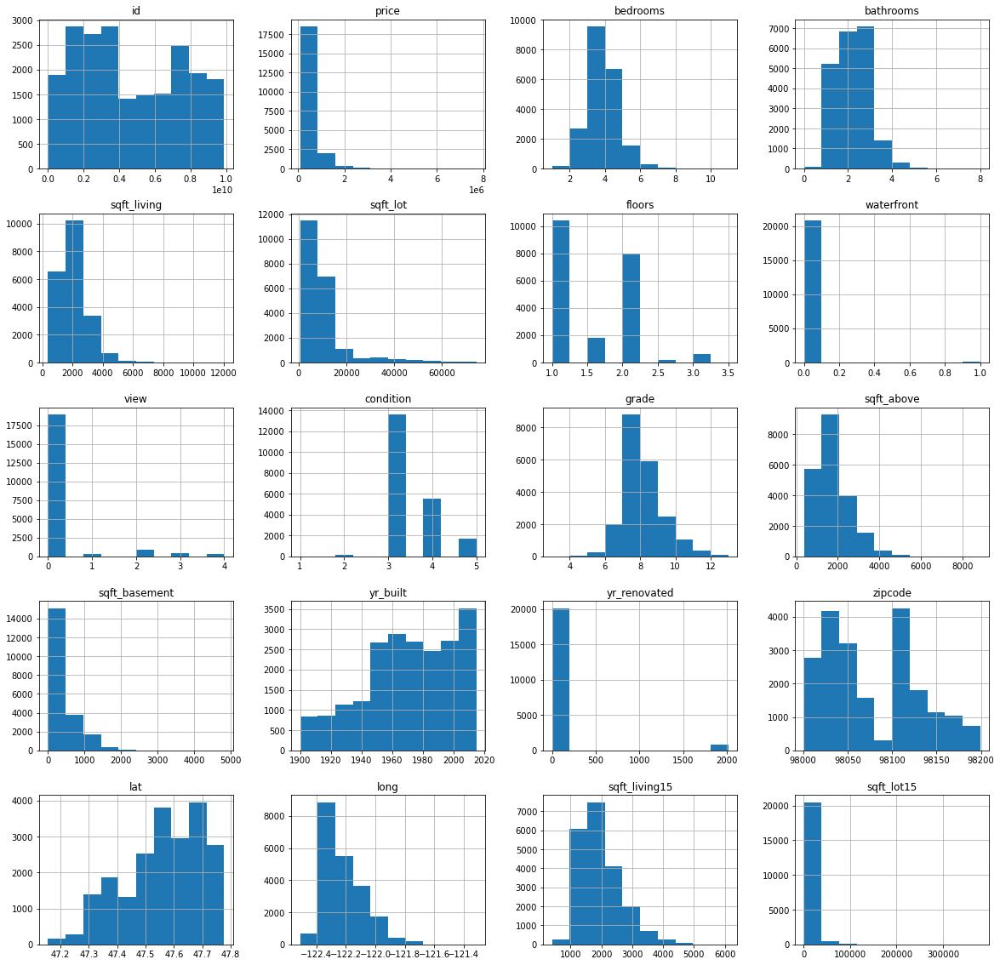

In [14]:
#create histogram for each variable in df 
histogram = newHousingDF.hist(bins=10, figsize=(20,20))

## 2.2 Plotting for categorical variables

newHousingDF does have some categorical variables: waterfront, view, condition, grade

<b>waterfront</b> - If the house has a waterfront view. Data Type: Numeric

<b>view</b> - If the house have been viewd. Data Type: Numeric

<b>condition</b> - How good the condition is ( Overall ). 1 indicates worn out property and 5 excellent. Data Type: Numeric

<b>grade</b> - The overall grade given to the housing unit, based on King County grading system. 1 poor ,13 excellent. Dat Type: Numeric

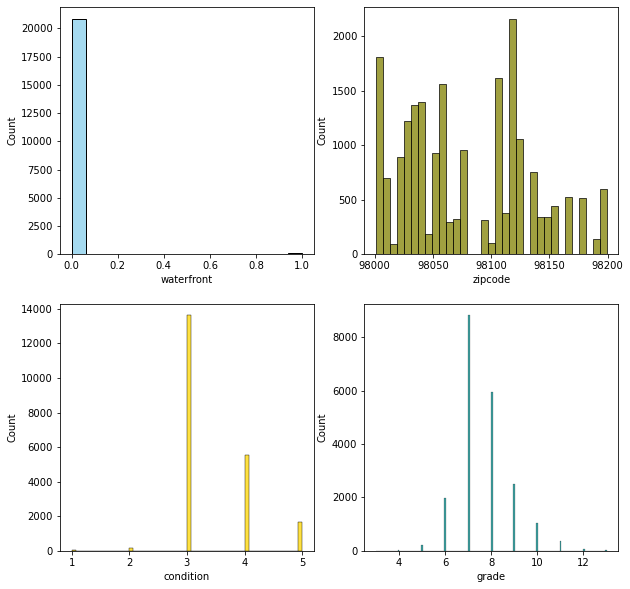

In [15]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

sns.histplot(data=newHousingDF, x="waterfront", color="skyblue", ax=axs[0, 0])
sns.histplot(data=newHousingDF, x="zipcode", color="olive", ax=axs[0, 1])
sns.histplot(data=newHousingDF, x="condition", color="gold", ax=axs[1, 0])
sns.histplot(data=newHousingDF, x="grade", color="teal", ax=axs[1, 1])



plt.show()

## 2.3 Reviewing for Outliers and Anamolies

I am using a boxplot to determine if there are any outliers with the target variable - the price column.

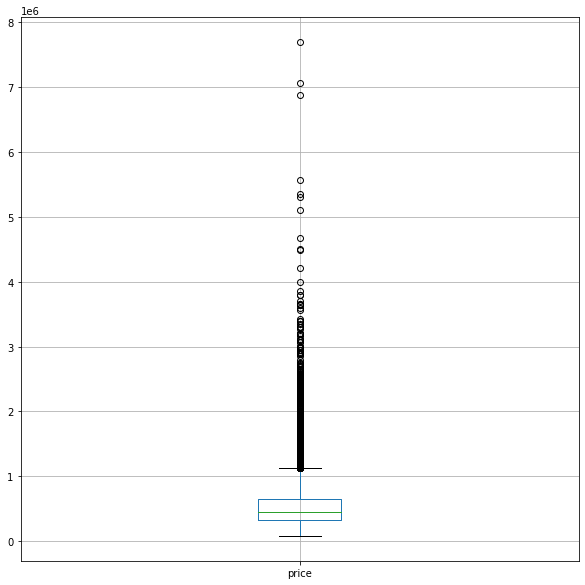

In [16]:
figure, ax = plt.subplots(figsize=(10, 10))
boxplot = newHousingDF.boxplot(column=['price'])

### Taking a closer look at the outliers

Let's take a look to see why there might be outliers

In [17]:
#Check the median of the house prices
medianHouse = newHousingDF.price.median()
medianHouse

449950.0

In [18]:
#View the houseswith the median house price 
newHousingDF[newHousingDF['price'] == medianHouse]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
747,293720140,20140605T000000,449950.0,3,2.50,2170,4912,2.0,0,0,...,7,2170.0,0,2003,0,98028,47.7767,-122.239,2010,4395
2393,5104511840,20140827T000000,449950.0,4,3.00,2800,6977,2.0,0,0,...,8,2800.0,0,2003,0,98038,47.3542,-122.014,2800,6600
5319,3735900545,20140523T000000,449950.0,3,2.00,1560,4080,2.0,0,0,...,7,1560.0,0,1923,1982,98115,47.6892,-122.319,1900,4080
5877,9826701735,20141112T000000,449950.0,3,2.00,1880,3048,2.0,0,0,...,7,1880.0,0,1902,0,98122,47.6031,-122.303,1680,3600
6450,3904901330,20140820T000000,449950.0,3,2.25,1610,5159,2.0,0,0,...,7,1610.0,0,1985,0,98029,47.5675,-122.019,1610,5210
6701,5469503280,20140721T000000,449950.0,4,2.50,3100,10000,2.0,0,0,...,9,3100.0,0,1978,0,98042,47.3741,-122.150,1850,9438
7687,3905100210,20140723T000000,449950.0,3,2.50,1530,3840,2.0,0,0,...,8,1530.0,0,1994,0,98029,47.5691,-122.007,1720,3985
10161,6305900350,20150422T000000,449950.0,4,3.00,3290,10783,2.0,0,0,...,9,3290.0,0,1990,0,98031,47.3904,-122.178,2810,10783
12782,2473370870,20150416T000000,449950.0,4,2.25,3490,8400,1.5,0,0,...,8,3490.0,0,1976,0,98058,47.4513,-122.128,2320,8723
13665,3579800180,20150504T000000,449950.0,4,1.50,1800,10150,1.5,0,0,...,7,1800.0,0,1958,0,98034,47.7325,-122.242,1630,10660


There are 172 houses with the price of $450,000.00 which contributes to the many outliers. 

# 3. Data Relationships - Explore the Data <a class="anchor" id="DataRelationships"></a> 

Before we explore the data, let's map the area to get a better visual understanding of the area. 

In [19]:
newHousingDF["sqft_lot"].mean() 

9844.07601447895

## 3.1 Mapping the Area

Now I am going to display the number of properties in each area in Kings County, Washington using plotly.

In [20]:
import plotly.express as px

fig = px.scatter_mapbox(newHousingDF, lat="lat", lon="long", color="zipcode",
                        zoom=10, mapbox_style='open-street-map', size_max=15,
                       title="The number of properties of each area in King County, Washington")
fig.show()

I will now display the price per square foot to visualize how expensive an aera is.

In [21]:
#add map of area of house prices 

price_per_sqft = newHousingDF['price'].apply(np.log) / newHousingDF['sqft_lot']

fig = px.scatter_mapbox(newHousingDF, lat="lat", lon="long", color=price_per_sqft,
                       size_max=15, zoom=10,mapbox_style='carto-positron',
                       title="The price per square foot of a house in King County, Washington",
                       color_discrete_sequence=[px.colors.cyclical.IceFire])
fig.show()

I will now show the variation of the house prices in King County, Washington.

In [22]:
fig = px.scatter_mapbox(newHousingDF, lat="lat", lon="long", color="price",
                        zoom=10, mapbox_style='open-street-map', size_max=15,
                       title="The variation of house price in King County, Washington"
                       )
fig.show()

Most of the more expensive houses are closer to Seattle.

## 3.2 Featured Correlation Heatmap

The featured correlation heatmap is used to determine if there are any multicollinear variables. 

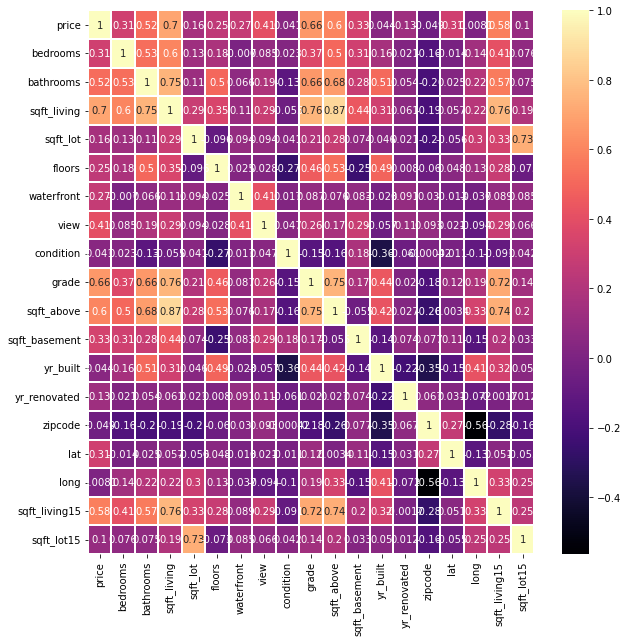

In [23]:
#Create the correlation matrix heat map with annotation
plt.subplots(figsize=(10,10))
sns.heatmap(newHousingDF.drop('id', axis=1).corr(), linewidths=.1, annot=True, cmap='magma');
plt.yticks(rotation=0);

The heatmap let us know that there's a strong positive correlation between 'price' and 'sqft_living'(0.70), 'grade'(0.67), and 'sqft_above'(0.61). 

There is also a strong correlation between 'grade' and 'sqft_above'(0.76) and 'grade' and 'sqft_living'(0.76), and 'sqft_grade' and 'sqft_living'(0.88).

'sqft_living' is the square footage of the entire house. 'sqft_above' is the square footage of the home minus the basement area. As the square footage of the house gets bigger, it is easy to see that "sqft_above" will also get larger.

## 3.3 Scatter Plots

In [24]:
# define useful function to create scatterplots of house prices against desired columns
def scatterplots(columns, ncol=None, figsize=(15, 15)):
    if ncol is None:
        ncol = len(columns)
    nrow = int(np.ceil(len(columns) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, squeeze=False)
    fig.subplots_adjust(wspace=0.5, hspace=0.6)
    for i, col in enumerate(columns):
        ax = axes.flatten()[i]
        ax.scatter(x = col, y = 'price', data=newHousingDF, alpha=0.5)
        ax.set(xlabel=col, ylabel='House price')
    nsubplots = nrow * ncol    
    for empty in range(i+1, nsubplots):
        axes.flatten()[empty].set_visible(False)

In [25]:
features = [x for x in newHousingDF.columns if x not in ['id', 'price']]
#'lat', 'long', 'sqft_lot15', 'sqft_living15'

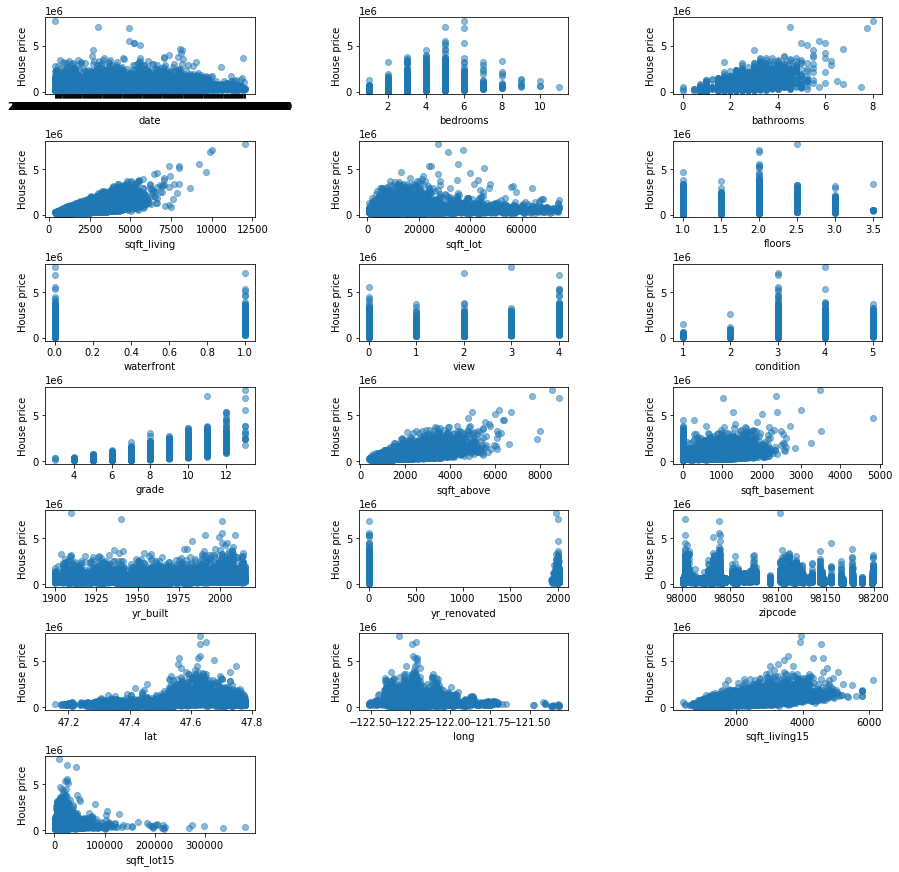

In [26]:
scatterplots(features, ncol=3, figsize=(15, 15))

Based on the scatter plots, we can see that 'floors', 'waterfront', 'view', 'condition', 'grade', 'yr_renovated', and 'zipcode' would be considered categorical variables.

## 3.4 Get Ranking Based on Zip Code Average House

### <b>House Price Percentage based on average zip code</b>

In [27]:
#percent ranking
df = newHousingDF.copy()

labels = ['Bottom 10%', '10-20%', '20-30%', '30-40%', '40-50%', '50-60%', '60-70%', '70-80%', '80-90%', 'Top 10%']
bins = [0, 0.0999, 0.1999, 0.2999, 0.3999, 0.4999, 0.5999, 0.6999, 0.7999, 0.8999, 1]

df['PercentRank'] = pd.qcut(
    df['price'],
    bins,
    labels = labels, 
    duplicates='drop')

df = df.sort_values(['zipcode', 'price'], ascending=False)
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,PercentRank
7907,1068000375,20140923T000000,3200000.0,6,5.00,7100,18200,2.5,0,0,...,5240.0,1860,1933,2002,98199,47.6427,-122.408,3130,6477,Top 10%
20535,1370800515,20141030T000000,2950000.0,4,4.25,4470,5884,2.0,0,1,...,3230.0,1240,2010,0,98199,47.6387,-122.405,2570,6000,Top 10%
11620,1069000070,20150415T000000,2795000.0,5,3.25,4590,12793,2.0,0,2,...,3590.0,1000,1928,0,98199,47.6453,-122.410,2920,8609,Top 10%
19323,5553300375,20140820T000000,2160000.0,3,3.50,3080,6495,2.0,0,3,...,2530.0,550,1996,2006,98199,47.6321,-122.393,4120,8620,Top 10%
15152,1370800225,20150318T000000,2152500.0,4,3.25,3840,6214,1.5,0,3,...,2590.0,1250,1939,0,98199,47.6388,-122.406,3280,5915,Top 10%
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3402,3356403820,20141205T000000,115000.0,2,1.00,1000,16524,1.0,0,0,...,1000.0,0,1913,0,98001,47.2841,-122.255,1350,10208,Bottom 10%
12208,4031000520,20140708T000000,115000.0,1,2.00,1150,9812,1.0,0,0,...,1150.0,0,1962,0,98001,47.2951,-122.284,1200,9812,Bottom 10%
20962,1278000210,20150311T000000,110000.0,2,1.00,828,4524,1.0,0,0,...,828.0,0,1968,2007,98001,47.2655,-122.244,828,5402,Bottom 10%
1218,3751600030,20140717T000000,100000.0,2,1.00,770,17334,1.0,0,0,...,770.0,0,1978,0,98001,47.2997,-122.269,1480,17334,Bottom 10%


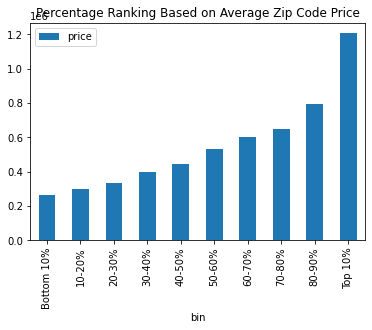

In [28]:
avgZip = df.groupby(['zipcode']).price.mean()

bins = [0, 0.0999, 0.1999, 0.2999, 0.3999, 0.4999, 0.5999, 0.6999, 0.7999, 0.8999, 1]
labels = ['Bottom 10%', '10-20%', '20-30%', '30-40%', '40-50%', '50-60%', '60-70%', '70-80%', '80-90%', 'Top 10%']

dfavgzip = pd.DataFrame(avgZip)
dfavgzip['bin']=pd.qcut(avgZip, bins, labels=labels,duplicates='drop')

dfavgzip.groupby('bin').mean().plot(kind='bar')


plt.title("Percentage Ranking Based on Average Zip Code Price")
plt.show()

### <b>Boxplot Based on All House Prices</b>

Now I am going to show boxplots based on their 'PercentRank' category

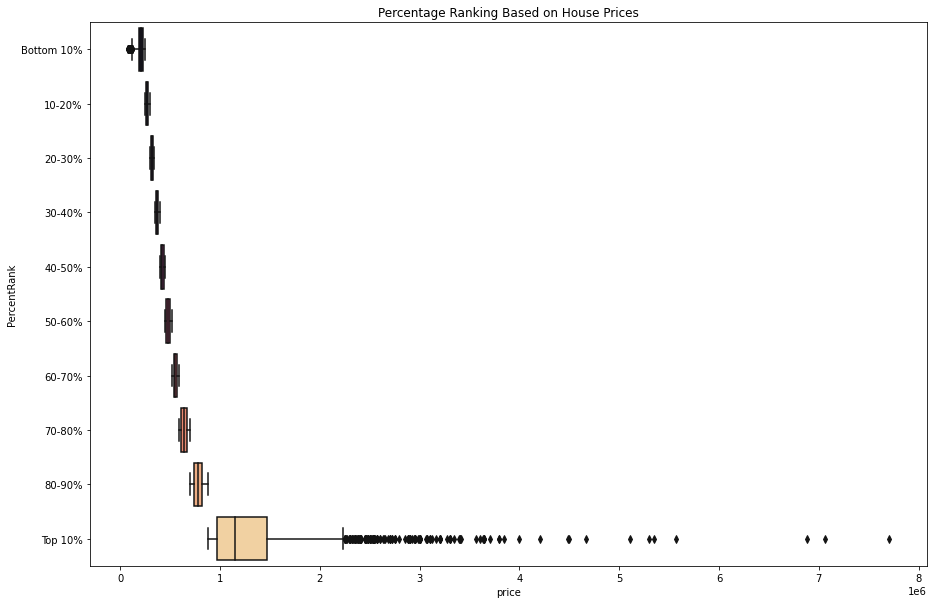

In [29]:
#create a box plot

figure, ax = plt.subplots(figsize=(15,10))
ax.set_title('Percentage Ranking Based on House Prices')

ax.yaxis.get_major_formatter().set_scientific(False)
ax.yaxis.get_major_formatter().set_useOffset(False)

ax = sns.boxplot(data=df, 
                 y='PercentRank', 
                 x='price', 
                 orient='h',
                 palette = 'magma')

It's difficult to see every single boxplot, so I am going to show the percent ranking with a barchart.

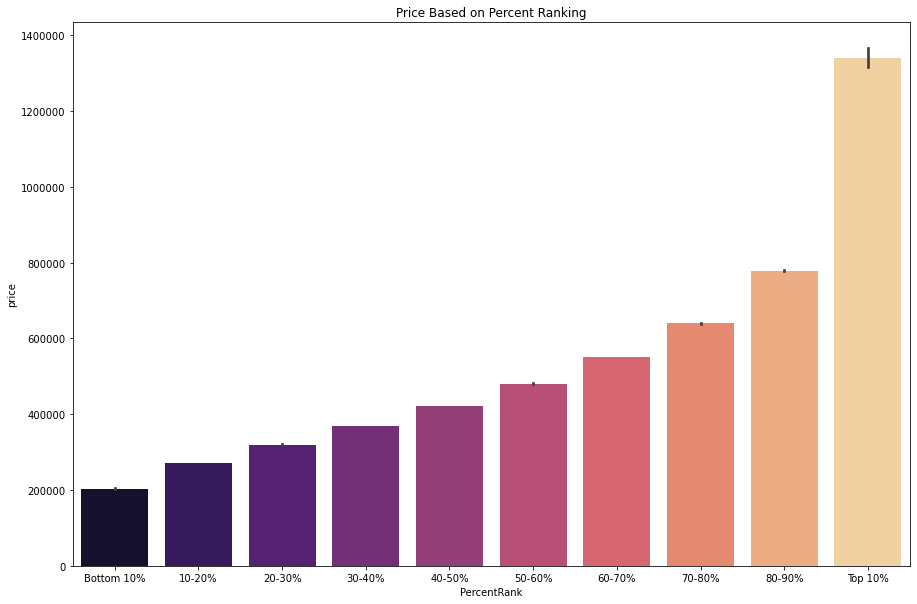

In [30]:
#create a barplot
#color palette: husl, plasma

figure, ax = plt.subplots(figsize=(15,10))
ax.set_title('Price Based on Percent Ranking')

ax.yaxis.get_major_formatter().set_scientific(False)
ax.yaxis.get_major_formatter().set_useOffset(False)

ax = sns.barplot(data=df, 
                 x='PercentRank', 
                 y='price', 
                 palette = 'magma')

### Get the range of the houses based on zipcode

In [31]:
#find range
minPrice = newHousingDF.groupby(['zipcode']).price.min()
maxPrice = newHousingDF.groupby(['zipcode']).price.max()

#get the range 
range_per_zip = maxPrice - minPrice

#Top highest rangest based on zip code
range_per_zip.sort_values(ascending=False).head()

zipcode
98102    7370000.0
98004    6637500.0
98039    6097500.0
98033    4980800.0
98040    4800000.0
Name: price, dtype: float64

## 3.5 View the Distribution of the Data <a class="anchor" id="DataDistribution"></a>

View some of the distribution based on the categorical features

### View distribution based on 'bedrooms'.

<Figure size 720x288 with 0 Axes>

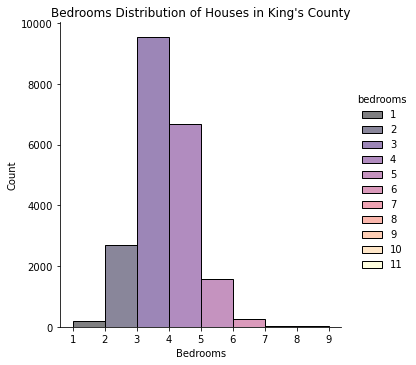

In [32]:
plt.figure(figsize=(10,4))

sns.displot(newHousingDF, x="bedrooms", bins=[1,2,3,4,5,6,7,8,9], hue='bedrooms', palette='magma').set(xlabel='Bedrooms', title="Bedrooms Distribution of Houses in King's County")

plt.show()

There is an outlier with 33 bedrooms which we might not need in the future.

### View distribution based on 'waterfront'.

<Figure size 720x288 with 0 Axes>

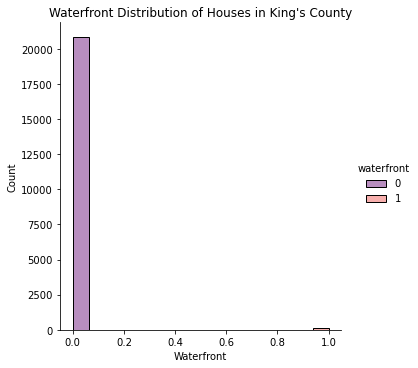

In [33]:
plt.figure(figsize=(10,4))

sns.displot(newHousingDF, x="waterfront", hue='waterfront', palette='magma').set(xlabel='Waterfront', title="Waterfront Distribution of Houses in King's County")

Most homes do not have a waterfront view.

### View distribution based on 'view'.

<Figure size 720x288 with 0 Axes>

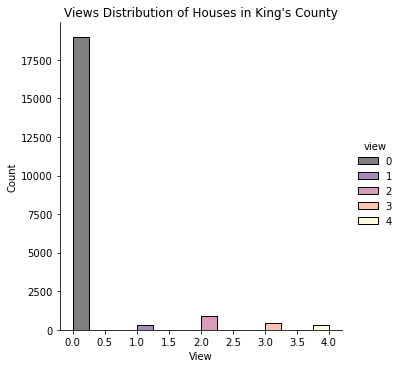

In [34]:
plt.figure(figsize=(10,4))

sns.displot(newHousingDF, x="view", hue='view', palette='magma').set(xlabel='View', title="Views Distribution of Houses in King's County")

### View distribution based on 'condition'.

<Figure size 720x288 with 0 Axes>

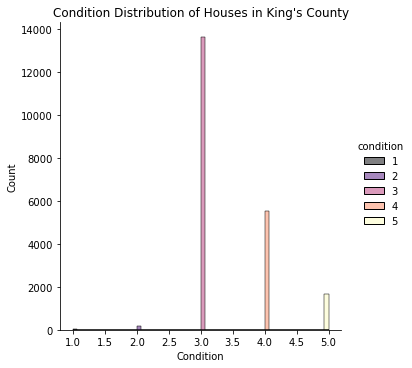

In [35]:
plt.figure(figsize=(10,4))

sns.displot(newHousingDF, x="condition",hue='condition', palette='magma').set(xlabel='Condition', title="Condition Distribution of Houses in King's County")

Most homes score a 3 on their house condition.

### View distribution based on 'grade'.

<Figure size 720x288 with 0 Axes>

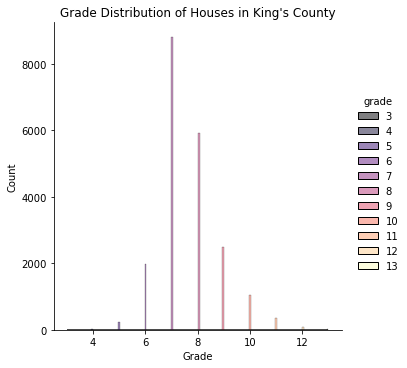

In [36]:
plt.figure(figsize=(10,4))

sns.displot(newHousingDF, x="grade",hue='grade', palette='magma').set(xlabel='Grade', title="Grade Distribution of Houses in King's County")

Most homes have a 7 for the grade of their homes.

## 3.5 Price vs features <a class="anchor" id="PriceVSFeatures"></a>

This section is to show the 'price' vs the other features in the dataset.

### Distribution of price

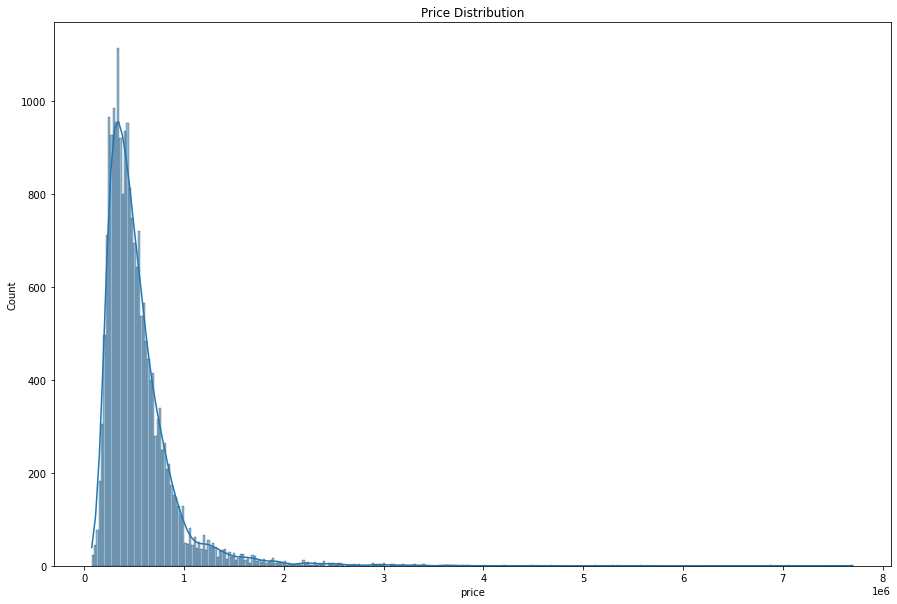

In [37]:
figure, ax = plt.subplots(figsize=(15,10))

ax = sns.histplot(x="price", data=newHousingDF, palette='magma', kde=True).set(title='Price Distribution')

#### Price vs Date

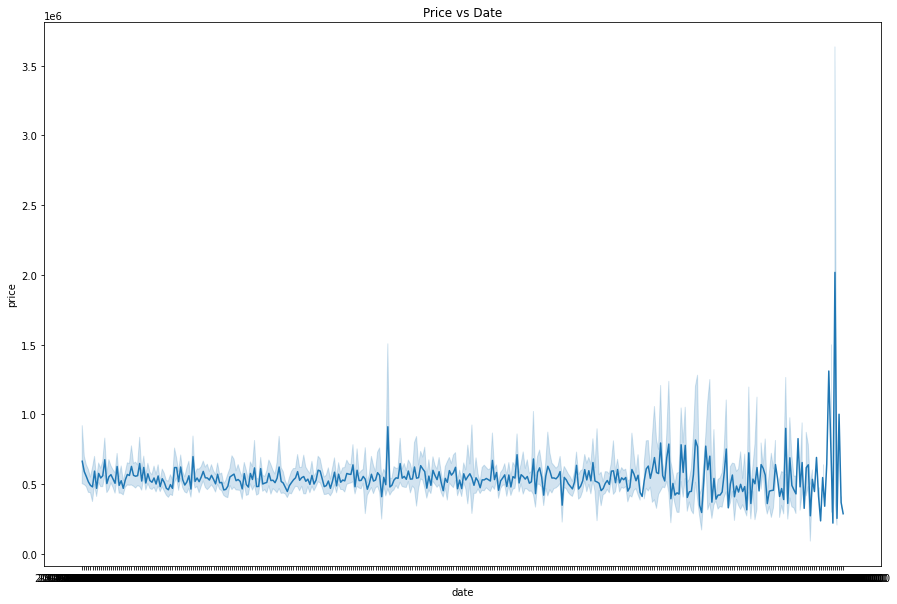

In [38]:
figure, ax = plt.subplots(figsize=(15,10))
ax = sns.lineplot(x="date", y="price", data=newHousingDF,).set(title='Price vs Date')

#### Price vs bedrooms

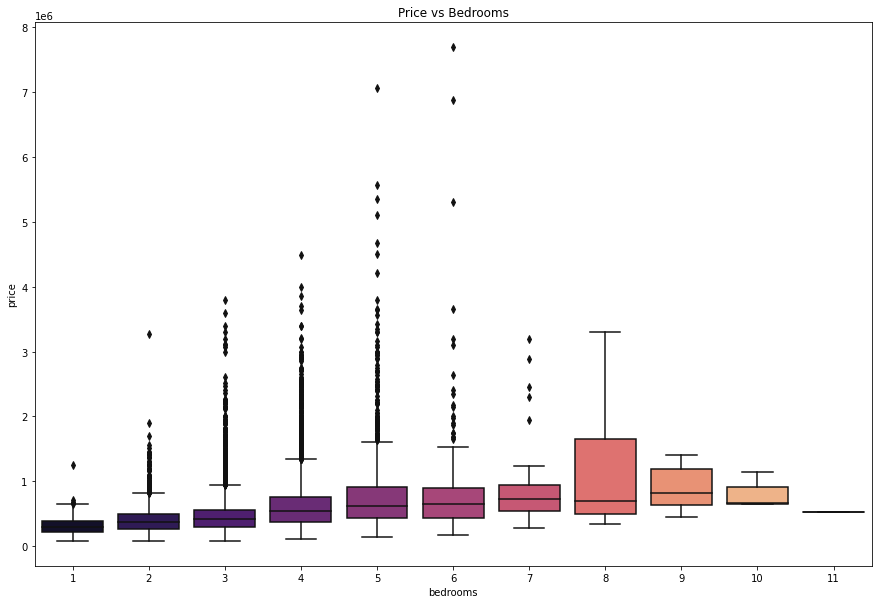

In [39]:
figure, ax = plt.subplots(figsize=(15,10))
ax = sns.boxplot(x="bedrooms", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Bedrooms')

#### Let's bucket the bedrooms.

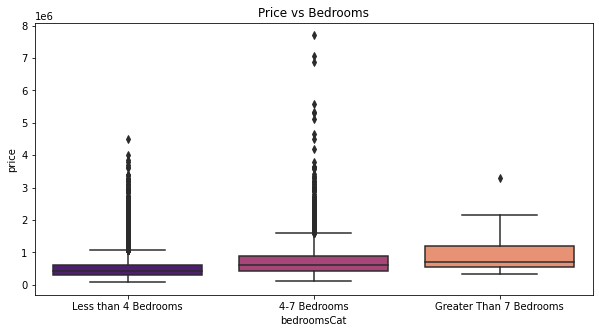

In [40]:
bedroomDF = newHousingDF.copy()

conditions = [
    (bedroomDF['bedrooms'] <= 4),
    (bedroomDF['bedrooms'] > 4) & (bedroomDF['bedrooms'] <= 7),
    (bedroomDF['bedrooms'] > 7)
    ]

values = ['Less than 4 Bedrooms', '4-7 Bedrooms', 'Greater Than 7 Bedrooms']


bedroomDF['bedroomsCat'] = np.select(conditions, values)

figure, ax = plt.subplots(figsize=(10,5))
ax = sns.boxplot(x="bedroomsCat", y="price",
                 data=bedroomDF, palette='magma').set(title='Price vs Bedrooms')

#### Price vs bathrooms

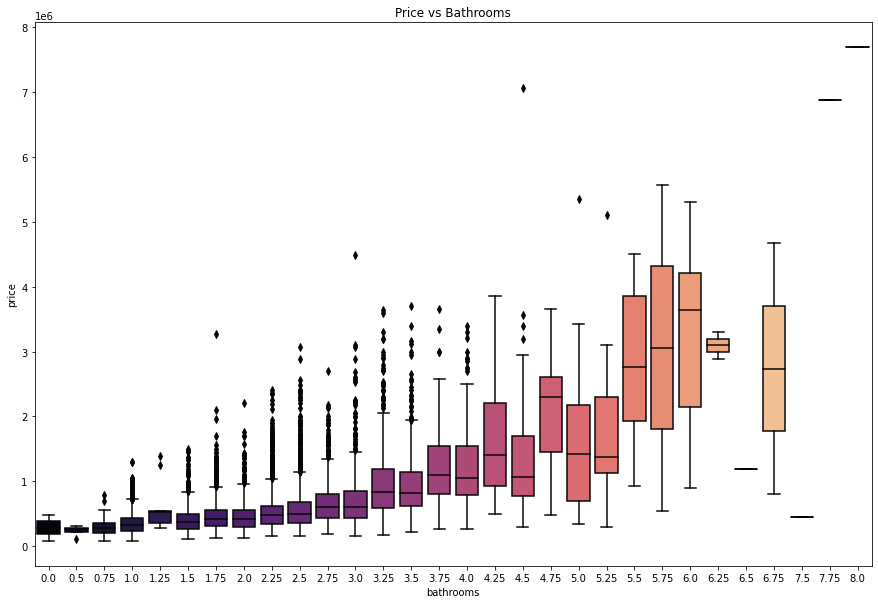

In [41]:
figure, ax = plt.subplots(figsize=(15,10))
ax = sns.boxplot(x="bathrooms", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Bathrooms')

### Let's bucket the bathrooms.

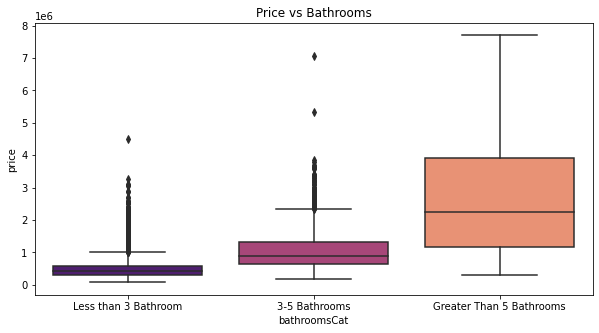

In [42]:
bathroomDF = newHousingDF.copy()


conditions = [
    (bathroomDF['bathrooms'] <= 3),
    (bathroomDF['bathrooms'] > 3) & (bathroomDF['bathrooms'] <= 5),
    (bathroomDF['bathrooms'] > 5)
    ]

values = ['Less than 3 Bathroom', '3-5 Bathrooms', 'Greater Than 5 Bathrooms']


bathroomDF['bathroomsCat'] = np.select(conditions, values)

figure, ax = plt.subplots(figsize=(10,5))
ax = sns.boxplot(x="bathroomsCat", y="price",
                 data=bathroomDF, palette='magma').set(title='Price vs Bathrooms')

#### Price vs sqft_living

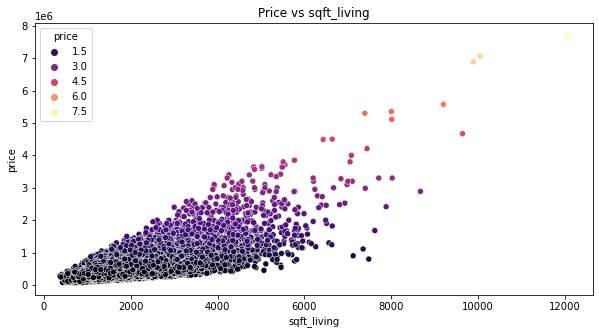

In [43]:
figure, ax = plt.subplots(figsize=(10,5))

ax = sns.scatterplot(x="sqft_living", y="price", hue="price",
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_living')

#### Price vs sqft_lot 

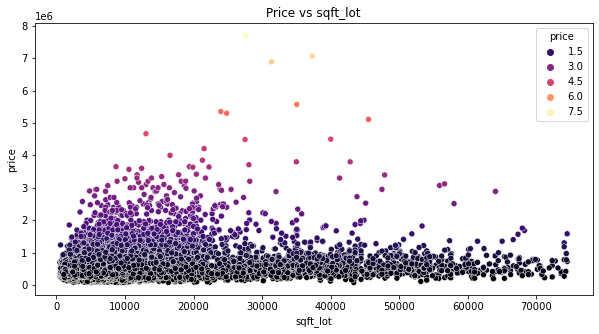

In [44]:
figure, ax = plt.subplots(figsize=(10,5))
ax = sns.scatterplot(x="sqft_lot", y="price",hue="price",
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_lot')

#### Price vs floors

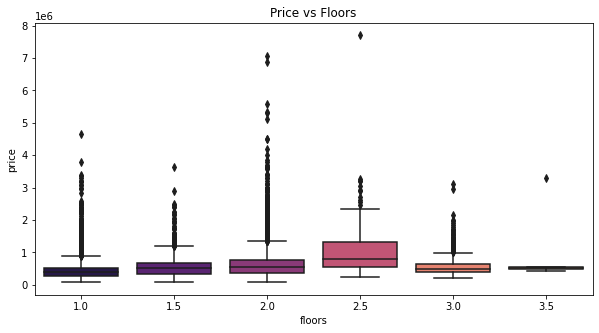

In [45]:
figure, ax = plt.subplots(figsize=(10,5))
ax = sns.boxplot(x="floors", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Floors')

#### Price vs waterfront

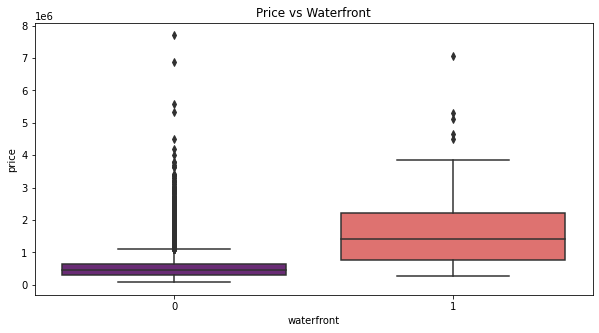

In [46]:
figure, ax = plt.subplots(figsize=(10,5))
ax = sns.boxplot(x="waterfront", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Waterfront')

#### Price vs view

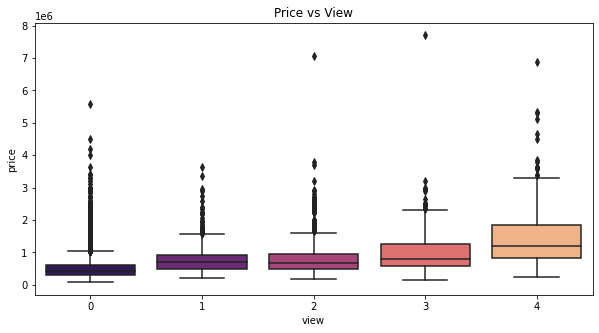

In [47]:
figure, ax = plt.subplots(figsize=(10,5))
ax = sns.boxplot(x="view", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs View')

#### Price vs condition

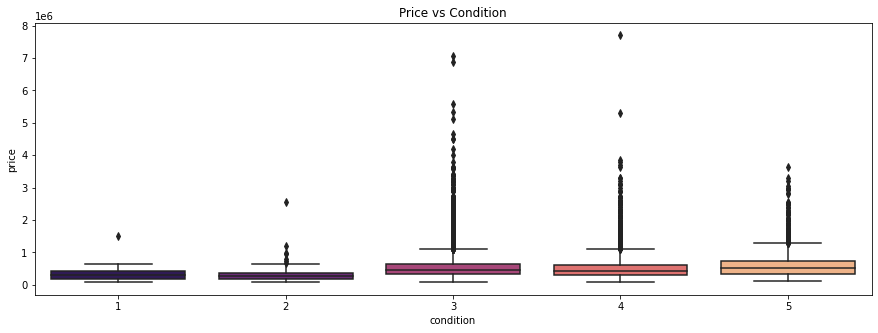

In [48]:
figure, ax = plt.subplots(figsize=(15,5))

ax = sns.boxplot(x="condition", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Condition')

#### Price vs grade

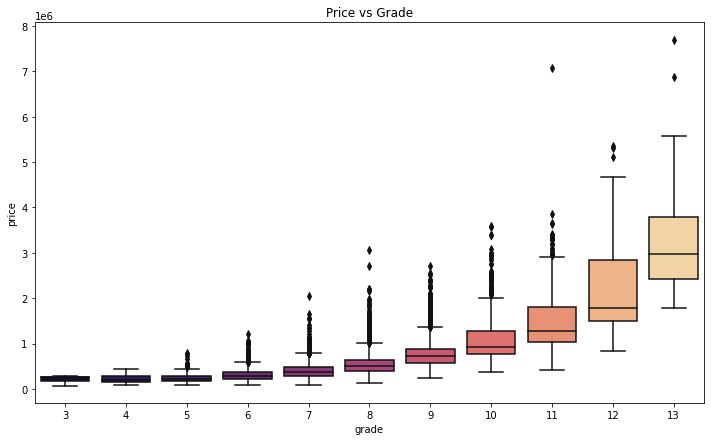

In [49]:
figure, ax = plt.subplots(figsize=(12,7))

ax = sns.boxplot(x="grade", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Grade')

#### Price vs sqft_above 

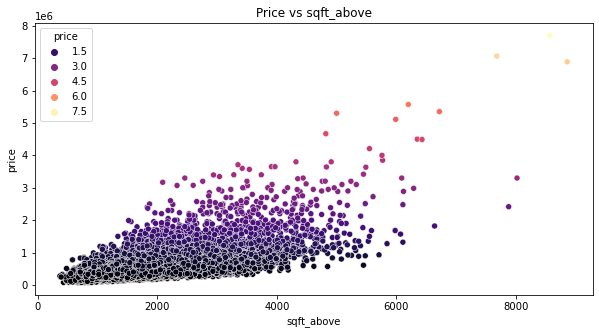

In [50]:
figure, ax = plt.subplots(figsize=(10,5))

ax = sns.scatterplot(x="sqft_above", y="price", hue='price',
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_above')

#### Price vs sqft_basement

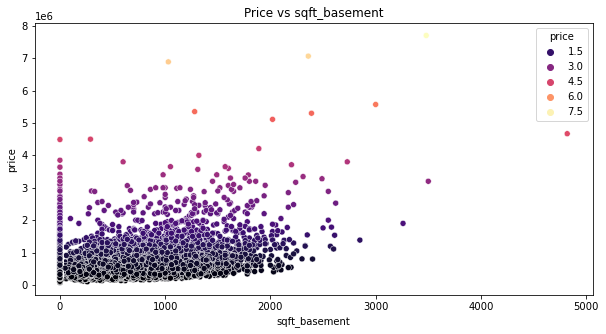

In [51]:
figure, ax = plt.subplots(figsize=(10,5))

ax = sns.scatterplot(x="sqft_basement", y="price", hue='price',
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_basement')

#### Price vs yr_built

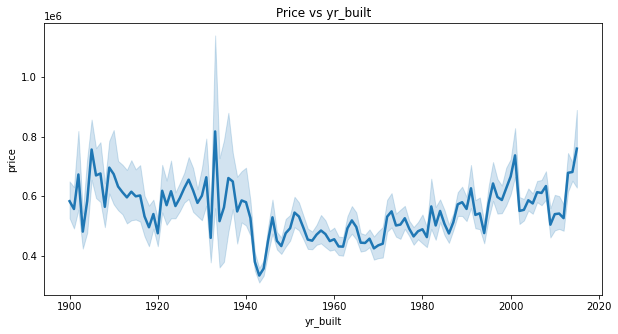

In [52]:
figure, ax = plt.subplots(figsize=(10,5))

ax = sns.lineplot(x="yr_built", y="price", linewidth=2.5,
                 data=newHousingDF).set(title='Price vs yr_built')

#### Price vs yr_renovated

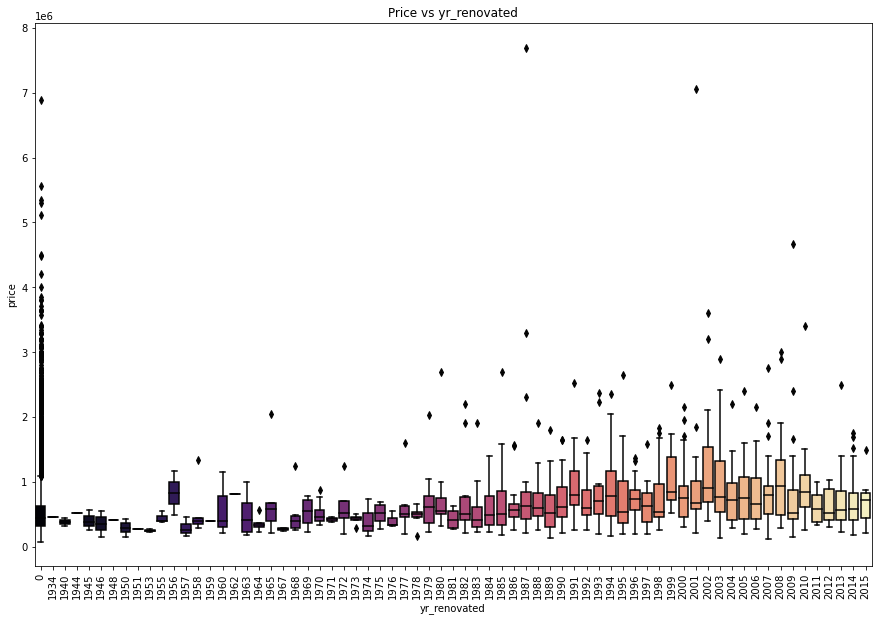

In [53]:
figure, ax = plt.subplots(figsize=(15,10))

ax = sns.boxplot(x="yr_renovated", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs yr_renovated')
plt.xticks(rotation=90);

<b>Let's look at the barplot of this.</b>

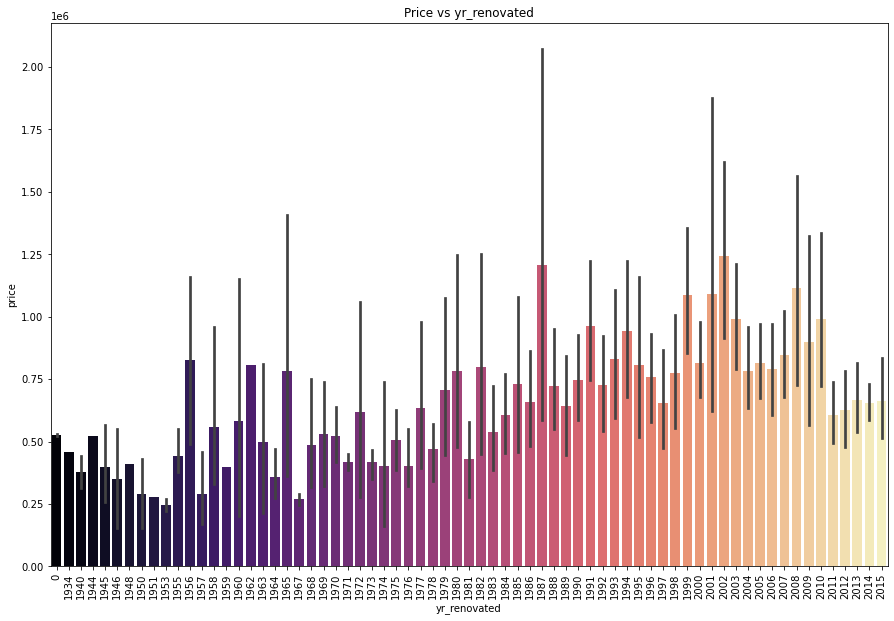

In [54]:
figure, ax = plt.subplots(figsize=(15,10))

ax = sns.barplot(x="yr_renovated", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs yr_renovated')
plt.xticks(rotation=90);

#### Price vs zipcode

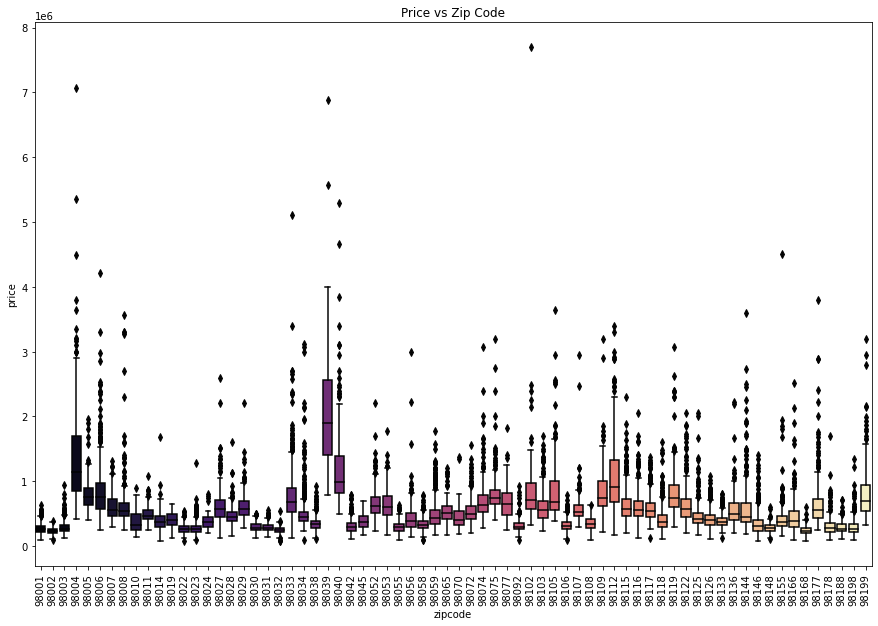

In [55]:
figure, ax = plt.subplots(figsize=(15,10))

ax = sns.boxplot(x="zipcode", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Zip Code')
plt.xticks(rotation=90);

<b>Let's look at the barplot of this.</b>

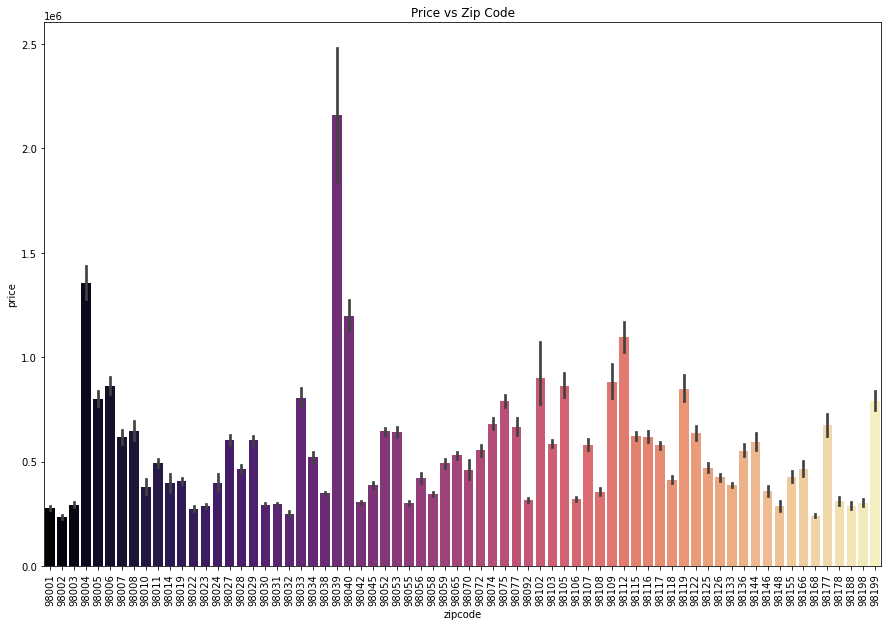

In [56]:
figure, ax = plt.subplots(figsize=(15,10))

ax = sns.barplot(x="zipcode", y="price",
                 data=newHousingDF, palette='magma').set(title='Price vs Zip Code')
plt.xticks(rotation=90);

#### Price vs lat

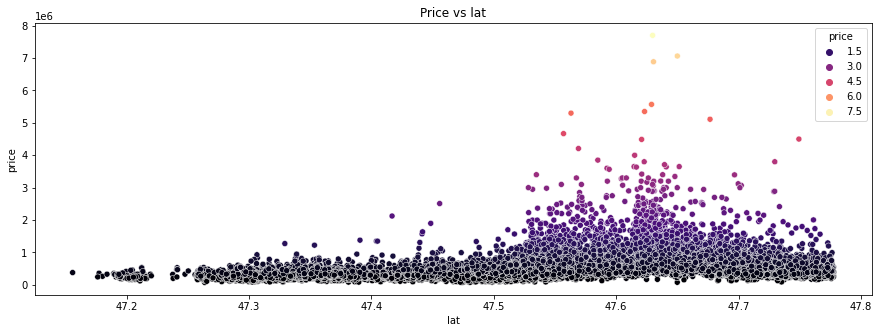

In [57]:
figure, ax = plt.subplots(figsize=(15,5))

ax = sns.scatterplot(x="lat", y="price", hue='price',
                 data=newHousingDF, palette='magma').set(title='Price vs lat')

#### Price vs long

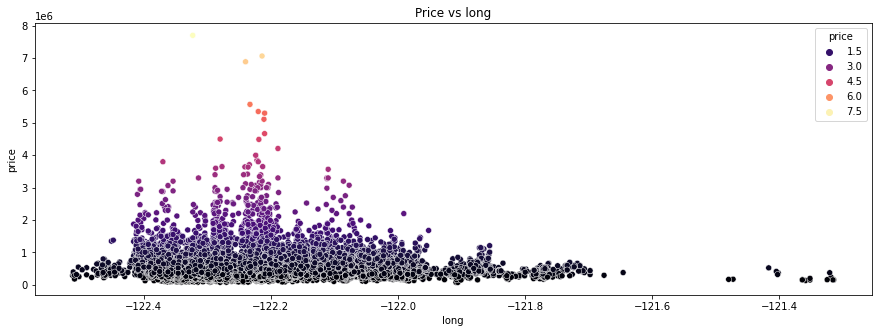

In [58]:
figure, ax = plt.subplots(figsize=(15,5)) 

ax = sns.scatterplot(x="long", y="price", hue='price',
                 data=newHousingDF, palette='magma').set(title='Price vs long')

#### Price vs sqft_living15

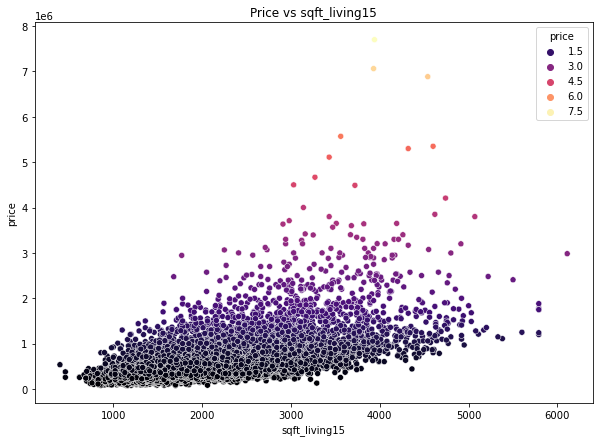

In [59]:
figure, ax = plt.subplots(figsize=(10,7))

ax = sns.scatterplot(x="sqft_living15", y="price",hue="price",
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_living15')

#### Price vs sqft_lot15

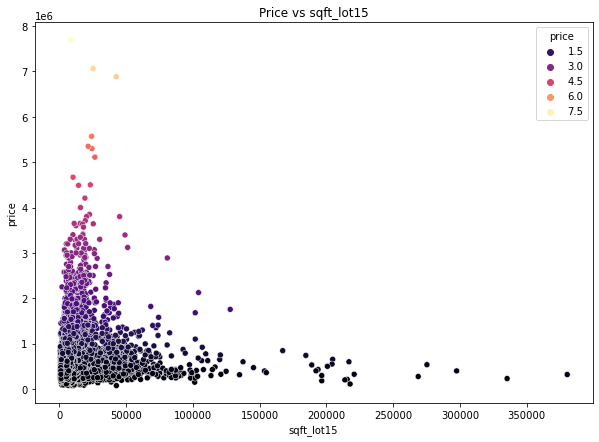

In [60]:
figure, ax = plt.subplots(figsize=(10,7))

ax = sns.scatterplot(x="sqft_lot15", y="price", hue='price',
                 data=newHousingDF, palette='magma').set(title='Price vs sqft_lot15')

## Let's view the top house prices.

In [61]:
topPrice = newHousingDF.sort_values("price", ascending=False).head()
topPrice

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7252,6762700020,20141013T000000,7700000.0,6,8.00,12050,27600,2.5,0,3,...,13,8570.0,3480,1910,1987,98102,47.6298,-122.323,3940,8800
3914,9808700762,20140611T000000,7062500.0,5,4.50,10040,37325,2.0,1,2,...,11,7680.0,2360,1940,2001,98004,47.6500,-122.214,3930,25449
9254,9208900037,20140919T000000,6885000.0,6,7.75,9890,31374,2.0,0,4,...,13,8860.0,1030,2001,0,98039,47.6305,-122.240,4540,42730
4411,2470100110,20140804T000000,5570000.0,5,5.75,9200,35069,2.0,0,0,...,13,6200.0,3000,2001,0,98039,47.6289,-122.233,3560,24345
1448,8907500070,20150413T000000,5350000.0,5,5.00,8000,23985,2.0,0,4,...,12,6720.0,1280,2009,0,98004,47.6232,-122.220,4600,21750


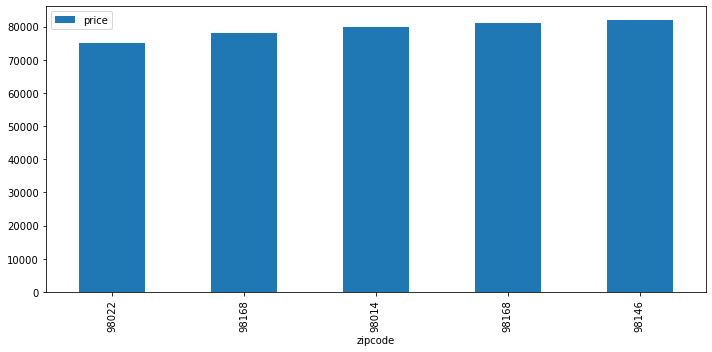

In [62]:
#Plot Top House Prices
newHousingDF.sort_values("price", ascending=True).head().plot(kind='bar', x="zipcode", 
                                                                y="price", figsize=(10,5))
plt.tight_layout()
plt.show()

## Let's view the Bottom house prices.

In [63]:
bottomPrice = newHousingDF.sort_values("price", ascending=True).head(5)
bottomPrice

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
1149,3421079032,20150217T000000,75000.0,1,0.00,670,43377,1.0,0,0,...,3,670.0,0,1966,0,98022,47.2638,-121.906,1160,42882
15293,40000362,20140506T000000,78000.0,2,1.00,780,16344,1.0,0,0,...,5,780.0,0,1942,0,98168,47.4739,-122.280,1700,10387
465,8658300340,20140523T000000,80000.0,1,0.75,430,5050,1.0,0,0,...,4,430.0,0,1912,0,98014,47.6499,-121.909,1200,7500
16198,3028200080,20150324T000000,81000.0,2,1.00,730,9975,1.0,0,0,...,5,730.0,0,1943,0,98168,47.4808,-122.315,860,9000
8274,3883800011,20141105T000000,82000.0,3,1.00,860,10426,1.0,0,0,...,6,860.0,0,1954,0,98146,47.4987,-122.341,1140,11250


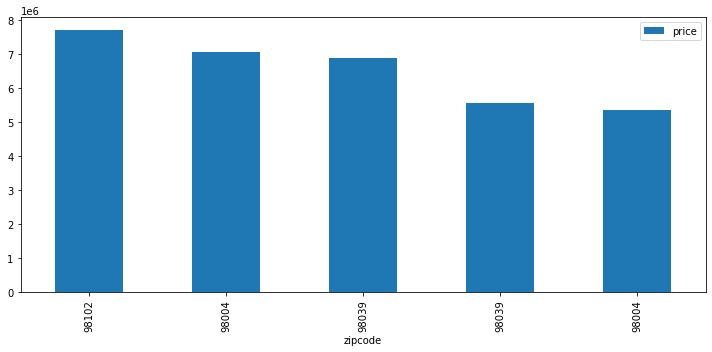

In [64]:
#Plot Bottom House Prices

newHousingDF.sort_values("price", ascending=False).head(5).plot(kind='bar', x="zipcode", 
                                                                 y="price", figsize=(10,5))
plt.tight_layout()
plt.show()

# Summary 

Based on the scatter plots, we can see that 'floors', 'waterfront', 'view', 'condition', 'grade', 'yr_renovated', and 'zipcode' would be considered categorical variables.

Based on the heatmap, here's a strong positive correlation between 'price' and 'sqft_living', 'grade', and 'sqft_above'. There is also a strong correlation between 'grade' and 'sqft_above' and 'sqft_living' and 'sqft_above' which makes them multicollinear.

These features will affect our house price.